In [1]:
import numpy as np
import numpy.random as npr
import matplotlib.pyplot as plt

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.linear_model import SGDClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split 

In [3]:
import math

In [4]:
import skimage as ski

In [5]:
import cv2 as cv

In [6]:
data_train = np.load('data_train.npy')
labels_train = np.load('labels_train.npy')

print(data_train.shape, labels_train.shape)

(270000, 8443) (8443,)


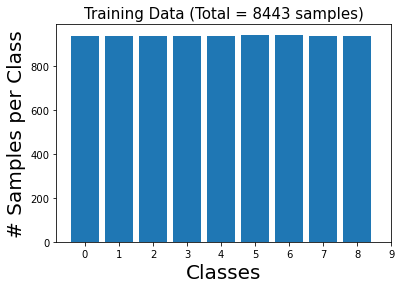

In [7]:
vals, counts = np.unique(labels_train, return_counts=True)

plt.bar(vals, counts)
plt.xticks(range(10),range(10))
plt.xlabel('Classes',size=20)
plt.ylabel('# Samples per Class', size=20)
plt.title('Training Data (Total = '+str(data_train.shape[1])+' samples)',size=15);

In [8]:
labels_names = ['a',
                'b',
                'c',
                'd',
                'e',
                'f',
                'g',
                'h',
                'i']

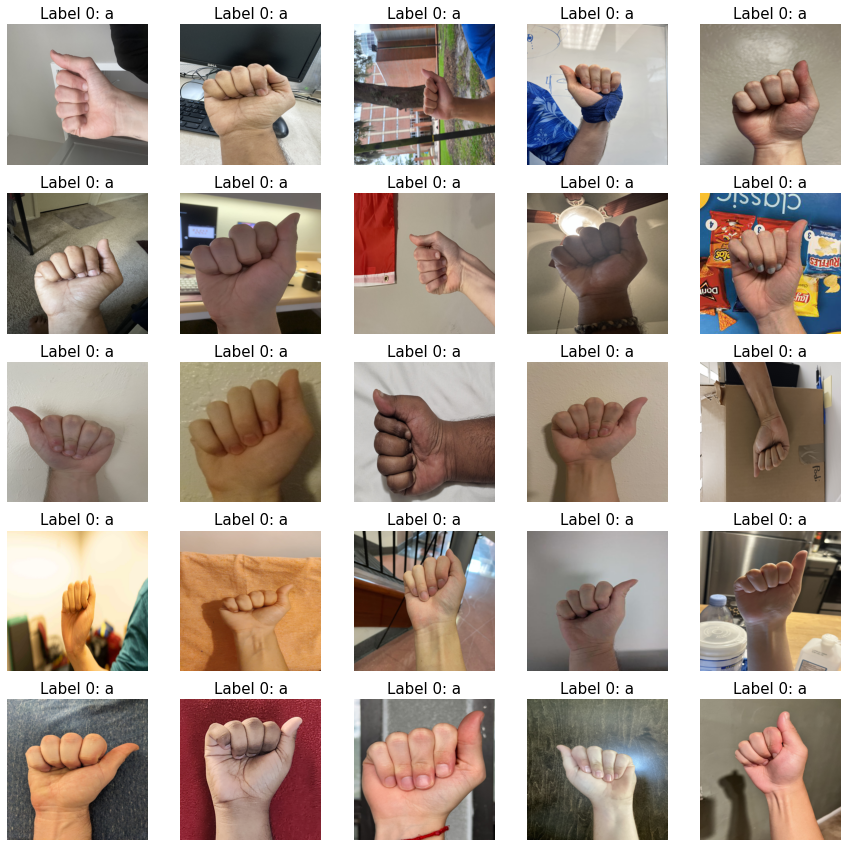

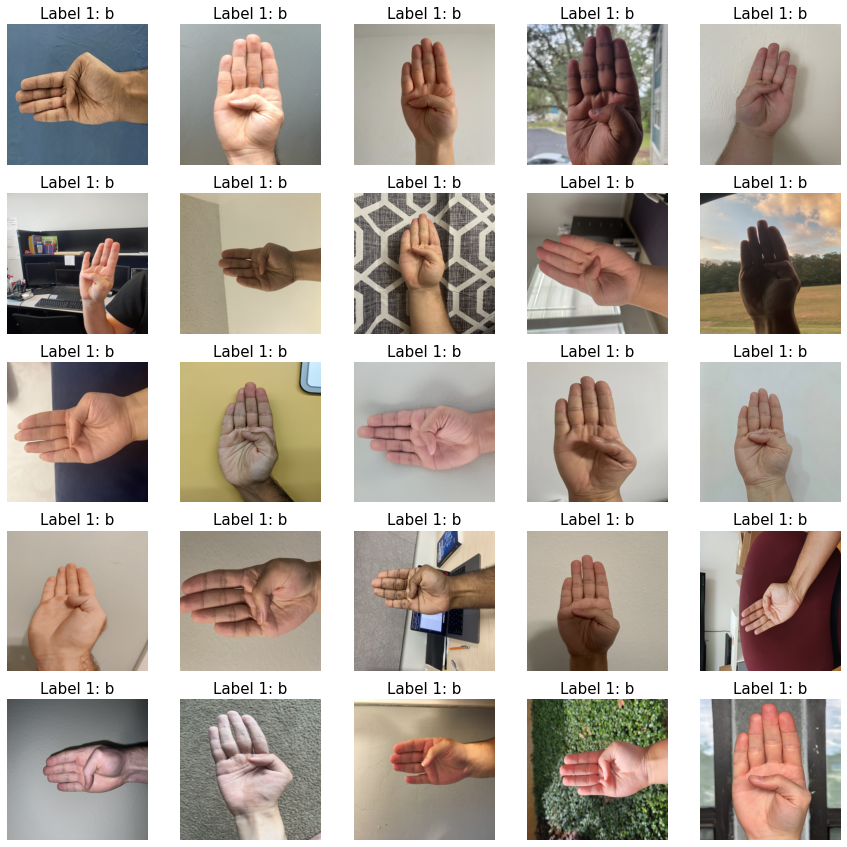

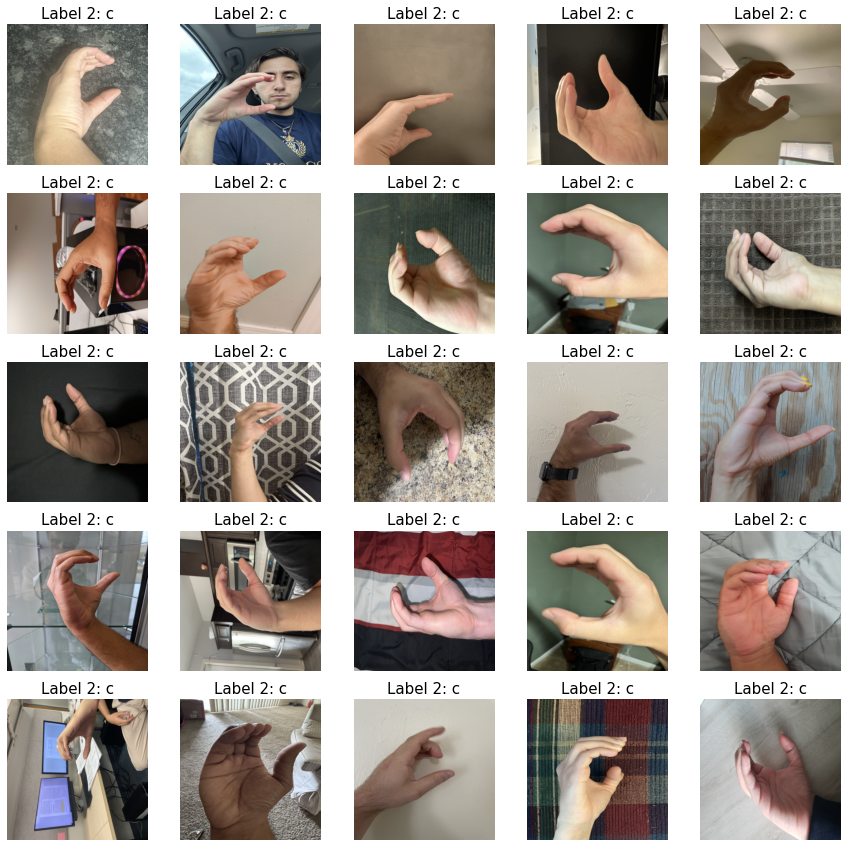

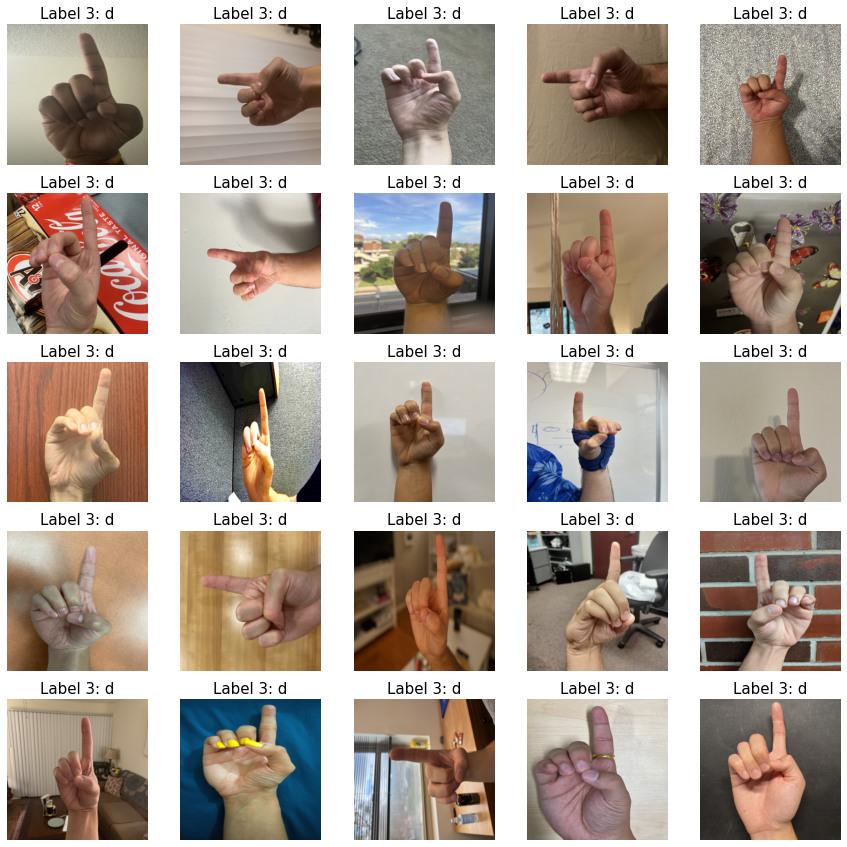

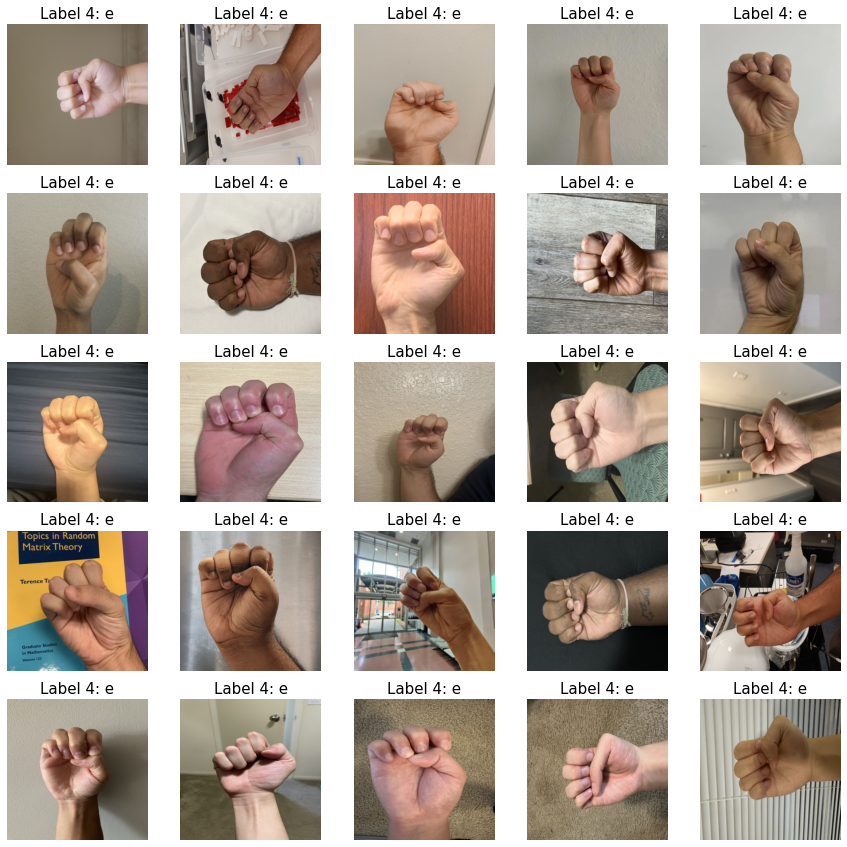

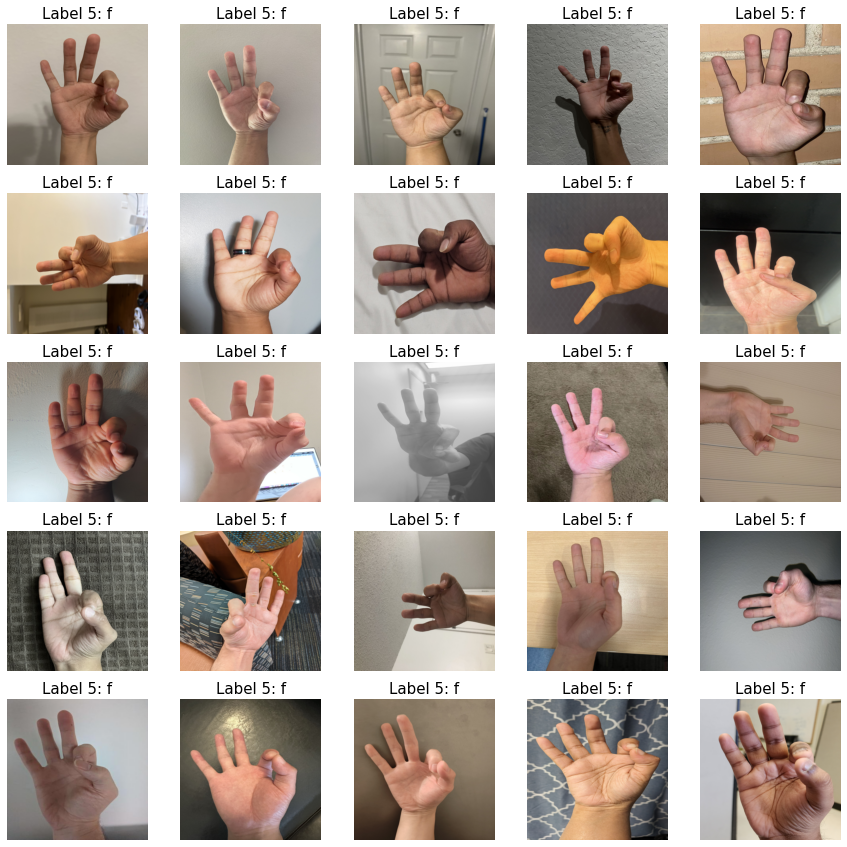

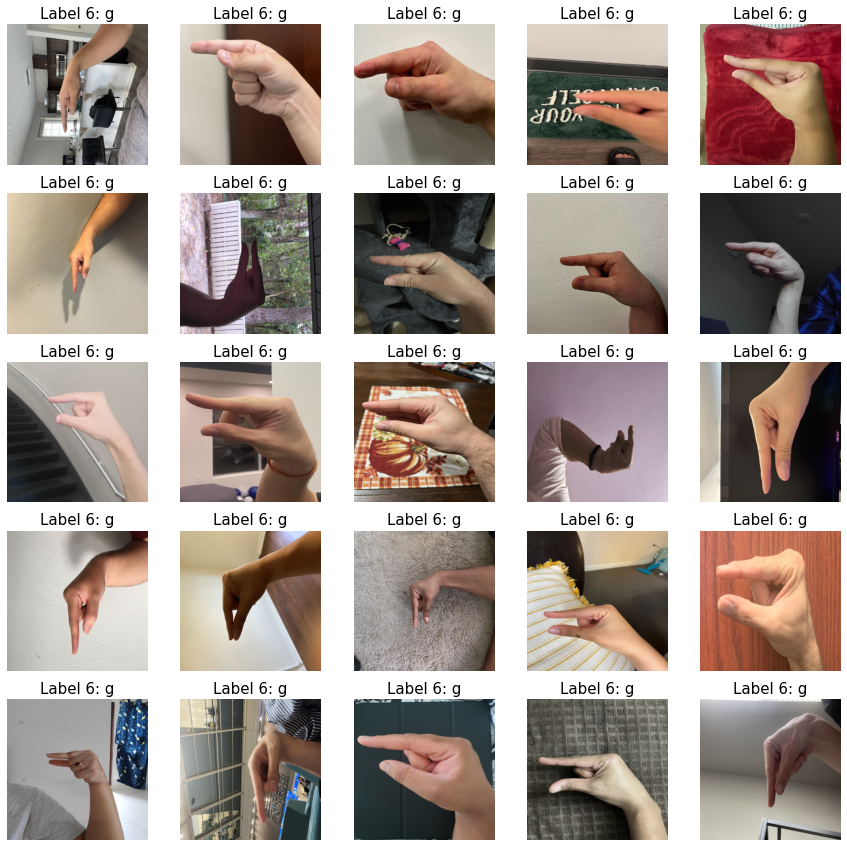

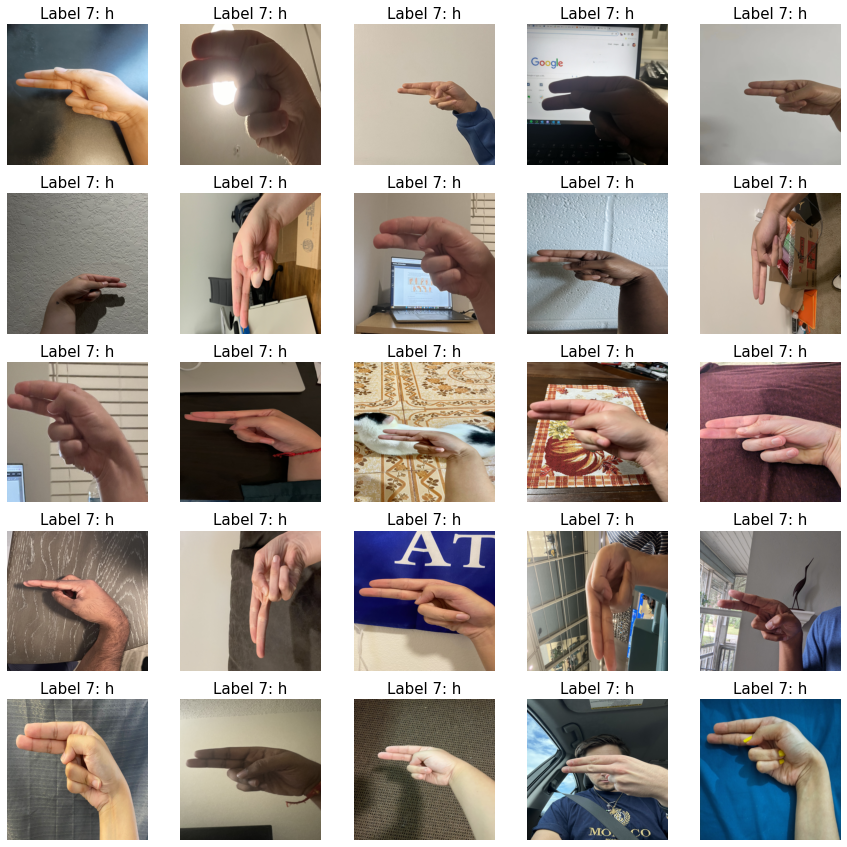

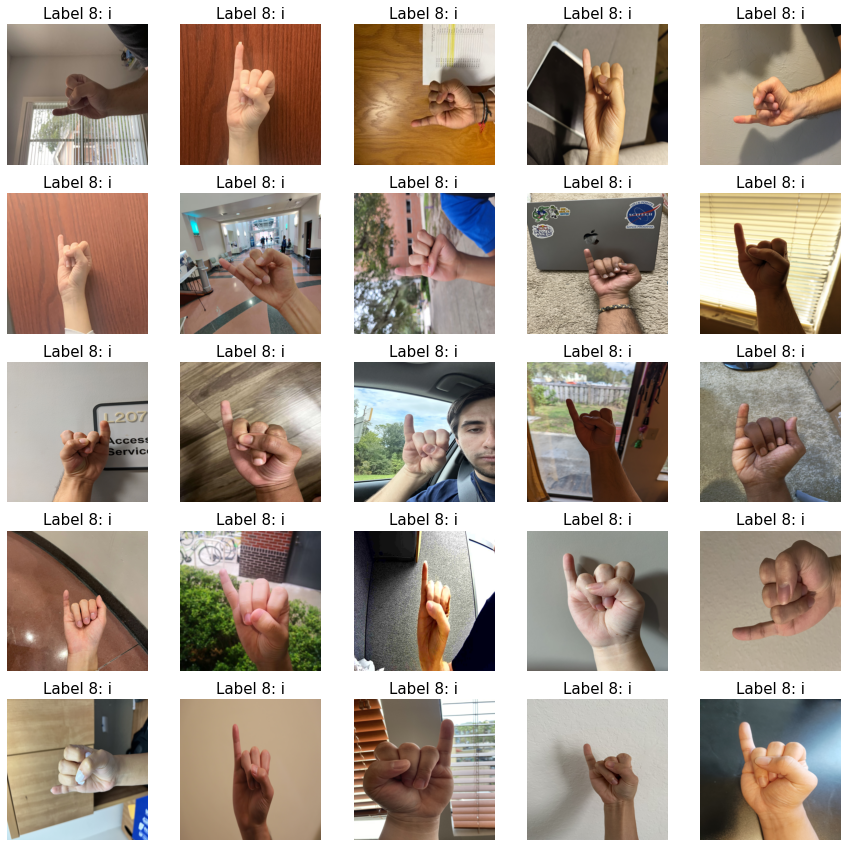

In [9]:
for i in range(0,9):
    rnd_sample = npr.permutation(np.where(labels_train==i)[0])
    fig=plt.figure(figsize=(15,15))
    for j in range(25):
        fig.add_subplot(5,5,j+1)
        plt.imshow(data_train[:,rnd_sample[j]].reshape((300,300,3)))
        label_idx = int(labels_train[rnd_sample[j]])
        plt.axis('off');plt.title('Label '+str(label_idx)+': '+labels_names[label_idx],size=15)
    plt.show()
    print('\n\n')

# Preprocess all images

In [47]:
for c in range(0, data.shape[1]):
    for r in range(0, data.shape[0]-3, 3):
        redChannel = data[r,c]
        data[r+1, c] = redChannel
        data[r+2, c] = redChannel


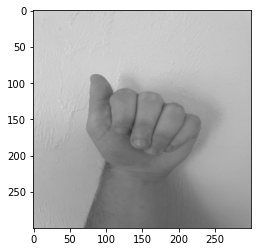

In [52]:
img = data[:, 0]
edges = cv.Canny(img,50,150)
plt.imshow(img.reshape((300,300, 3)), cmap='gray', vmin=0, vmax=225)

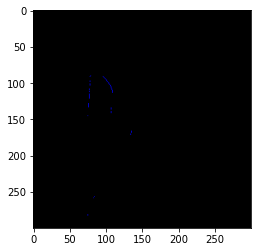

In [53]:
plt.imshow(edges.reshape((300,300, 3)), cmap='gray', vmin=0, vmax=225)

## Make Images Gray Scale

In [46]:
data = data_train
del data_train

In [17]:
data_grayscale = np.zeros((90000, 8443))

In [18]:
data_grayscale.shape

(90000, 8443)

In [19]:
for c in range(0, data.shape[1]):
    for r in range(0, data.shape[0]-3, 3):
        data_grayscale[math.floor(r/3), c] = data[r,c]
del data

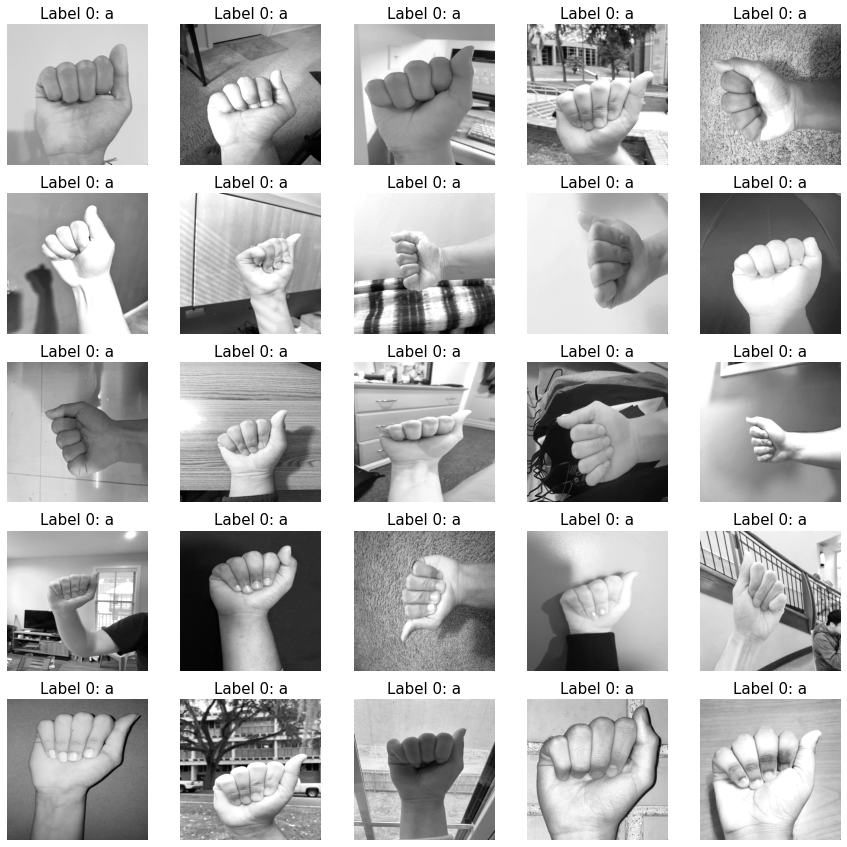

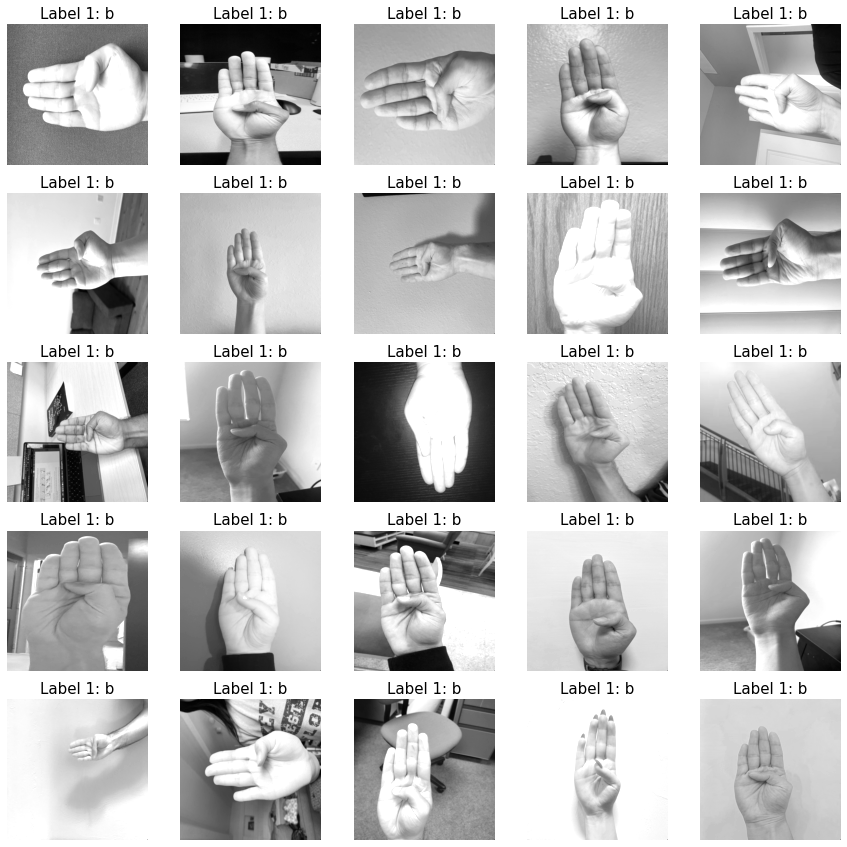

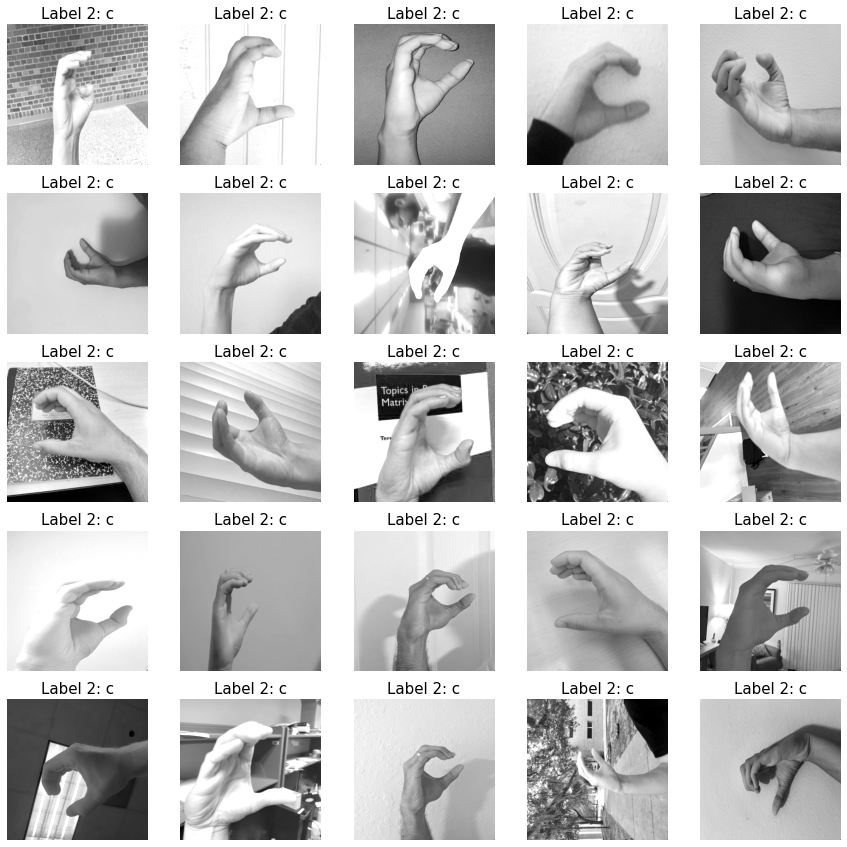

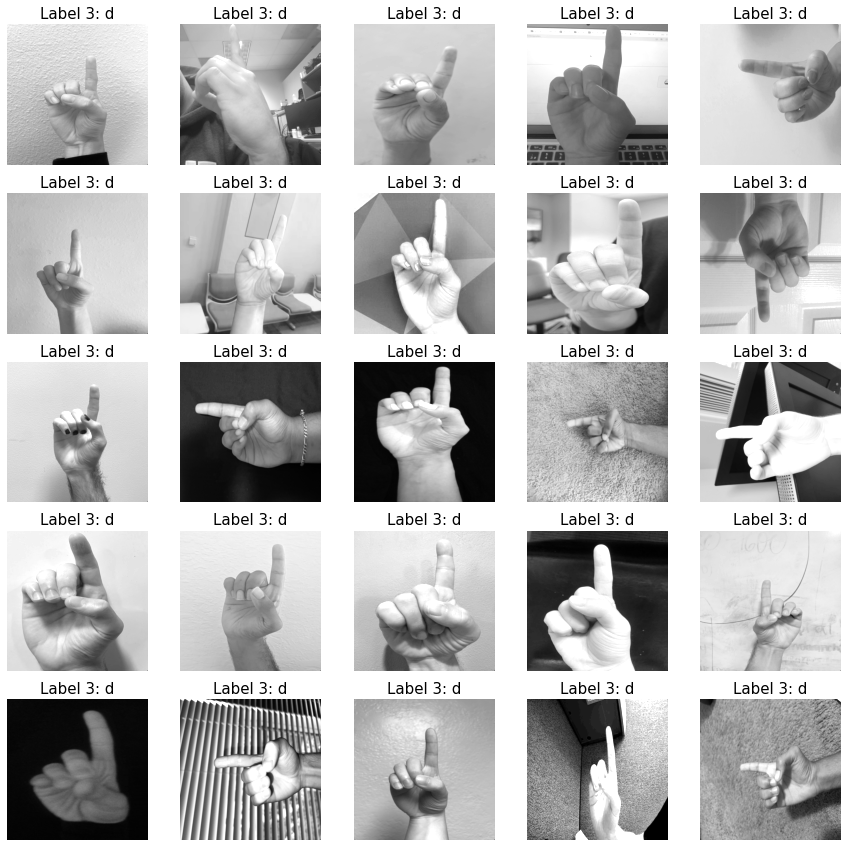

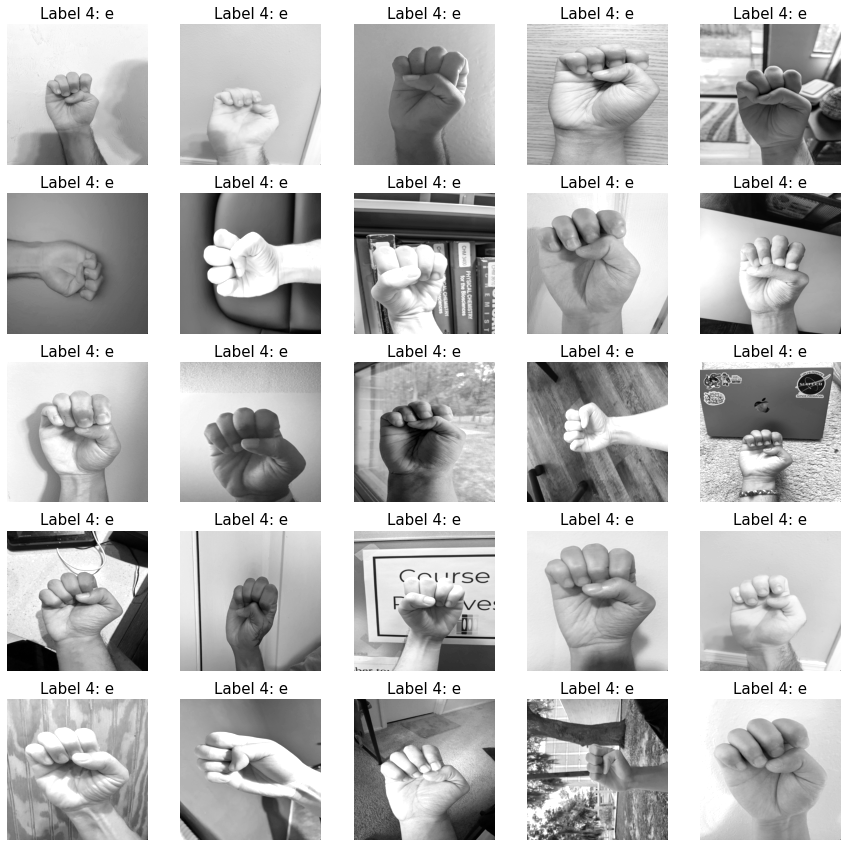

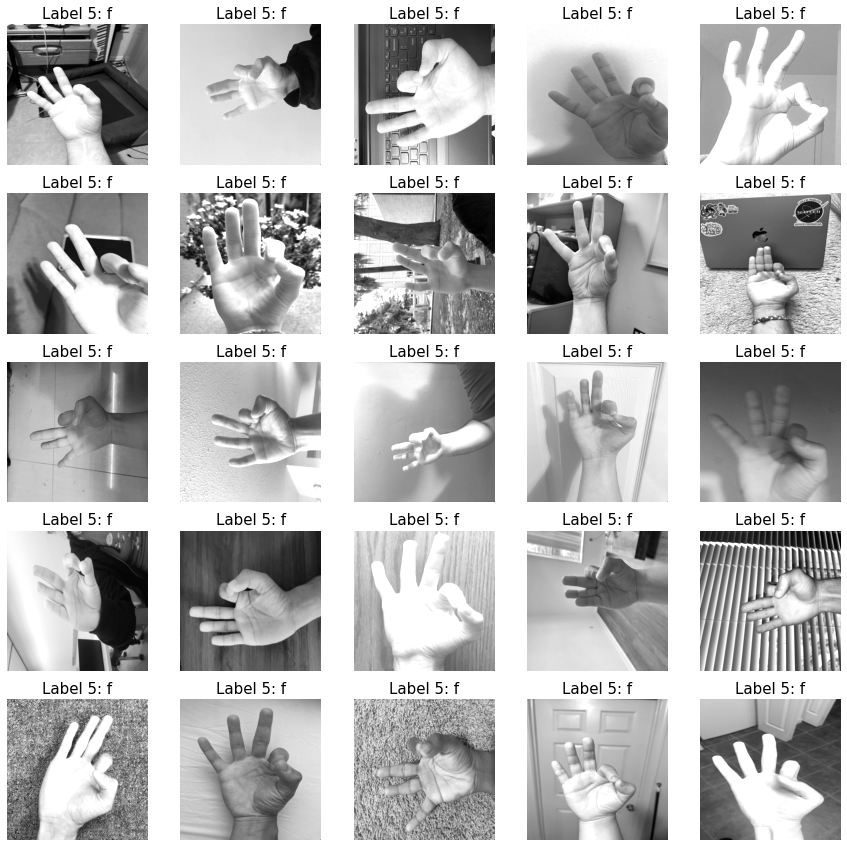

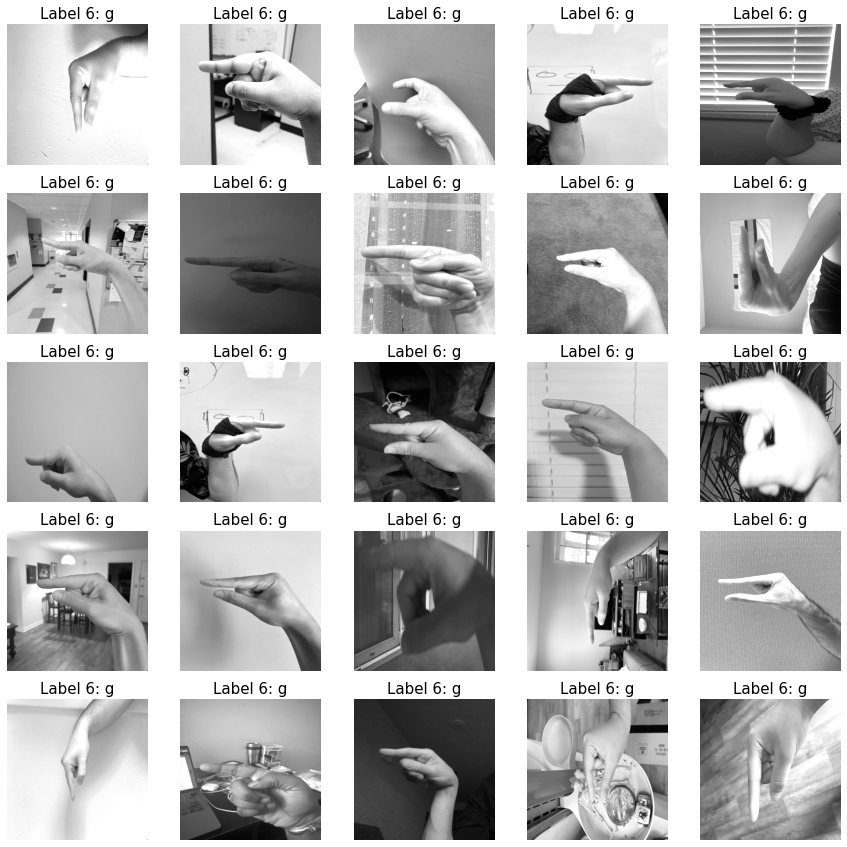

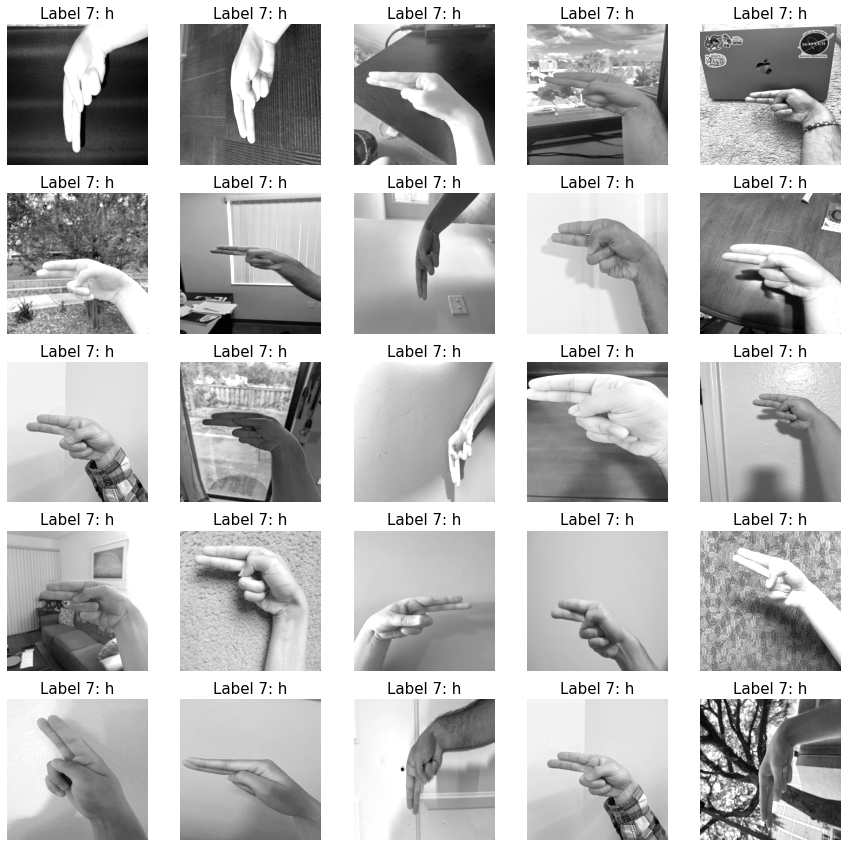

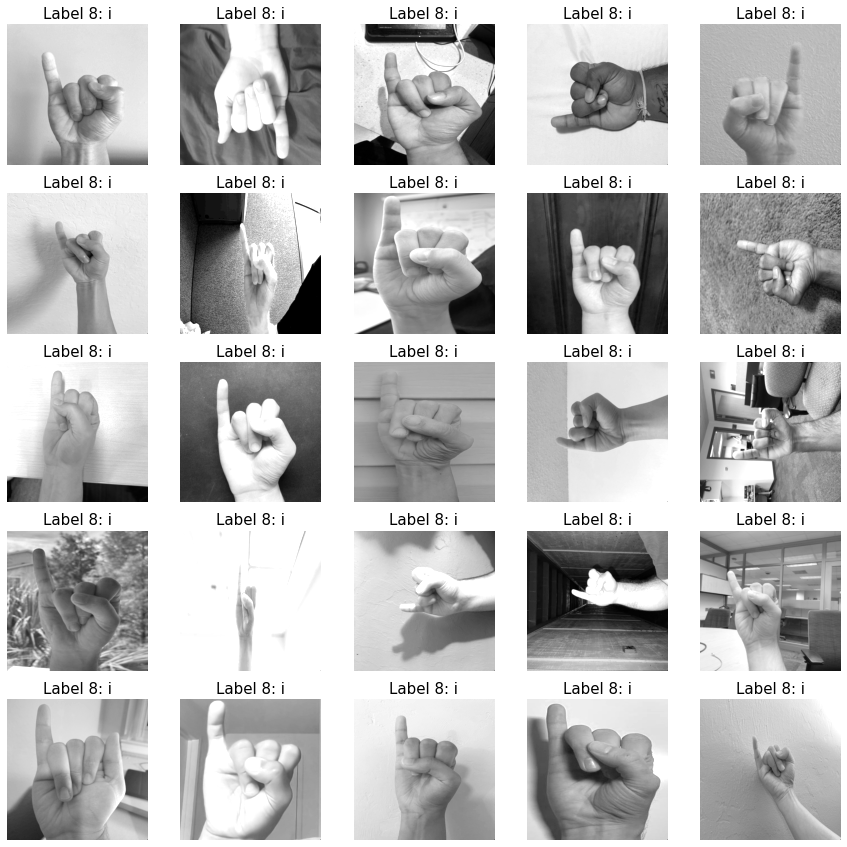

In [20]:
for i in range(0,9):
    rnd_sample = npr.permutation(np.where(labels_train==i)[0])
    fig=plt.figure(figsize=(15,15))
    for j in range(25):
        fig.add_subplot(5,5,j+1)
        plt.imshow(data_grayscale[:,rnd_sample[j]].reshape((300,300, 1)), cmap='gray', vmin=0, vmax=225)
        label_idx = int(labels_train[rnd_sample[j]])
        plt.axis('off');plt.title('Label '+str(label_idx)+': '+labels_names[label_idx],size=15)
    plt.show()
    print('\n\n')

## Resize Images to 100 x 100 

In [14]:
data_sized = np.zeros((10000, 8443))

In [15]:
for c in range(0, data_grayscale.shape[1]):
    data_sized[:, c] = ski.transform.resize(data_grayscale[:, c].reshape((300, 300, 1)), (100, 100, 1)).reshape(10000)

In [16]:
del data_grayscale

In [17]:
data_train = data_sized
del data_sized

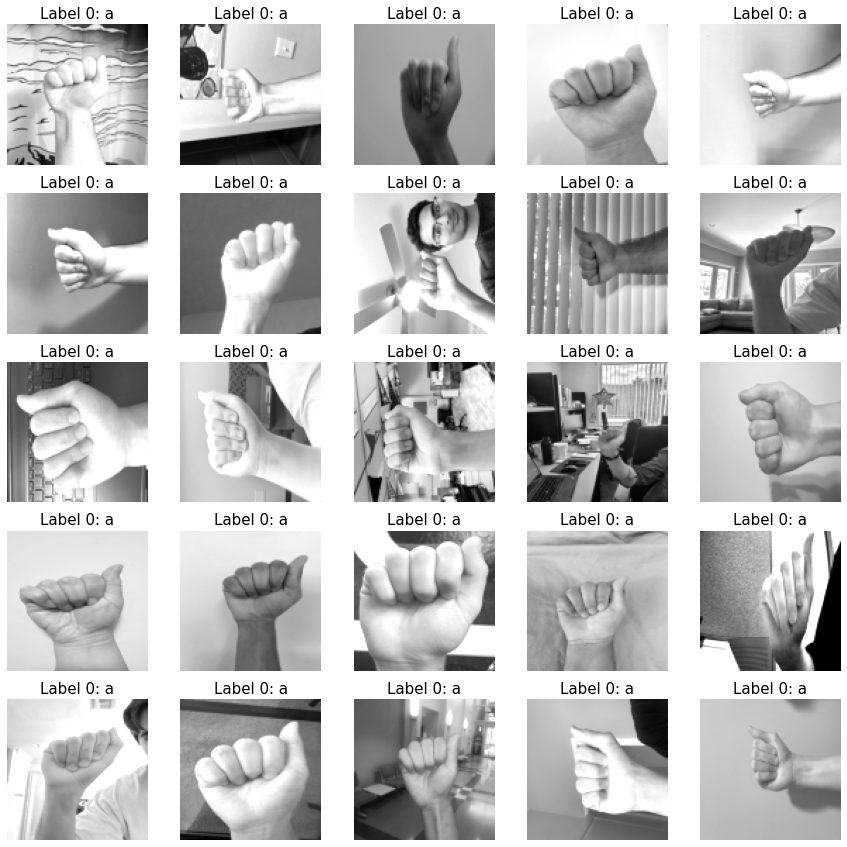

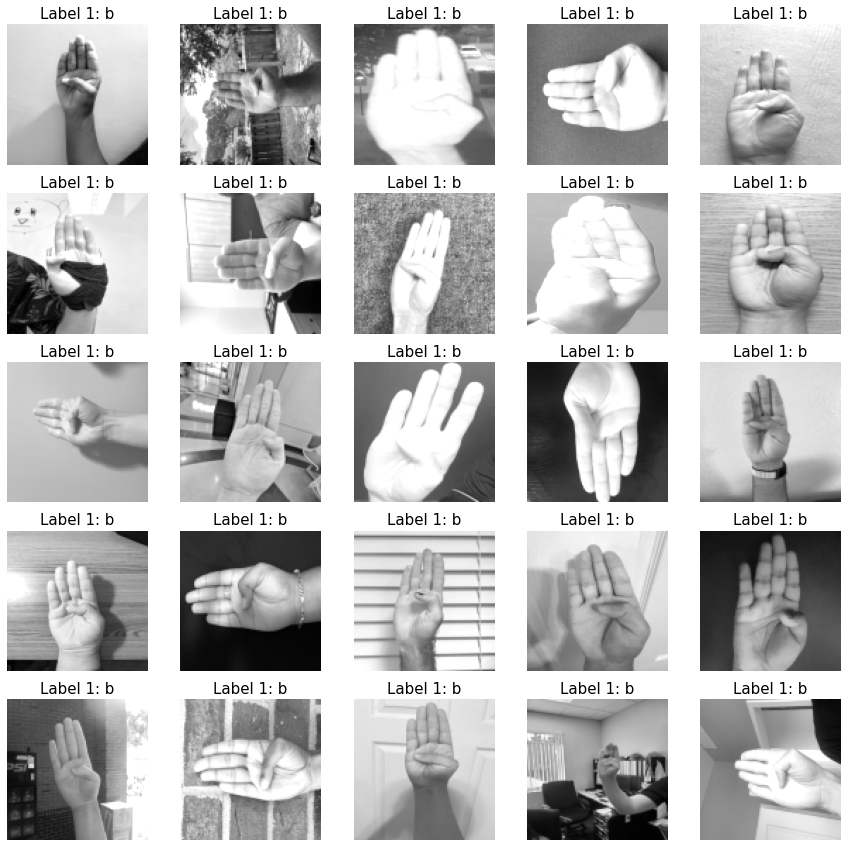

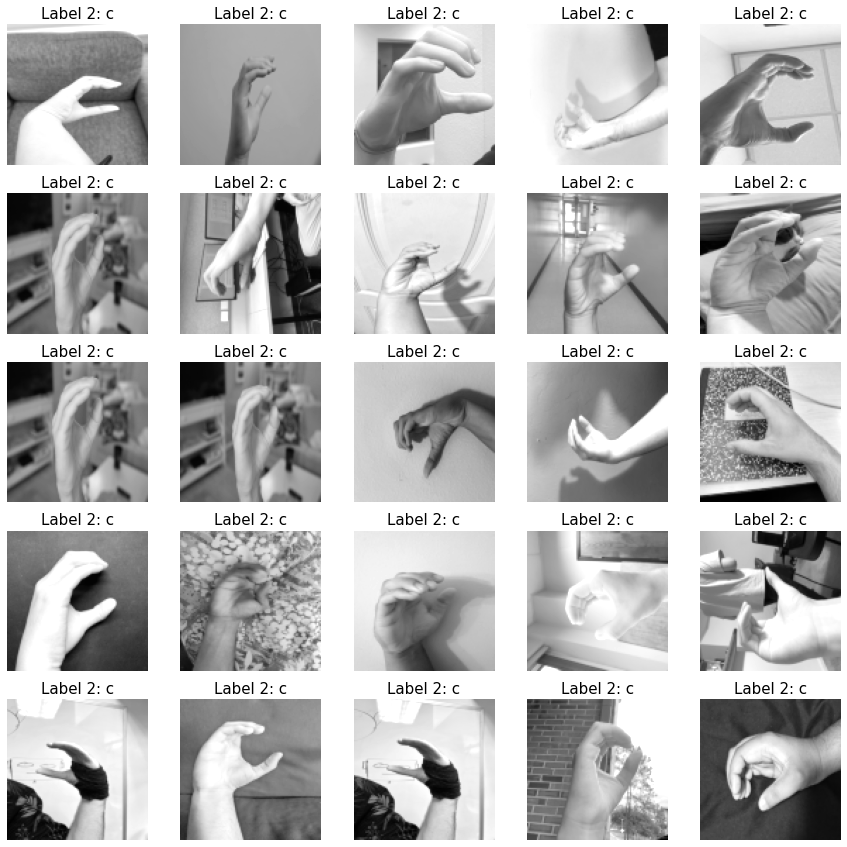

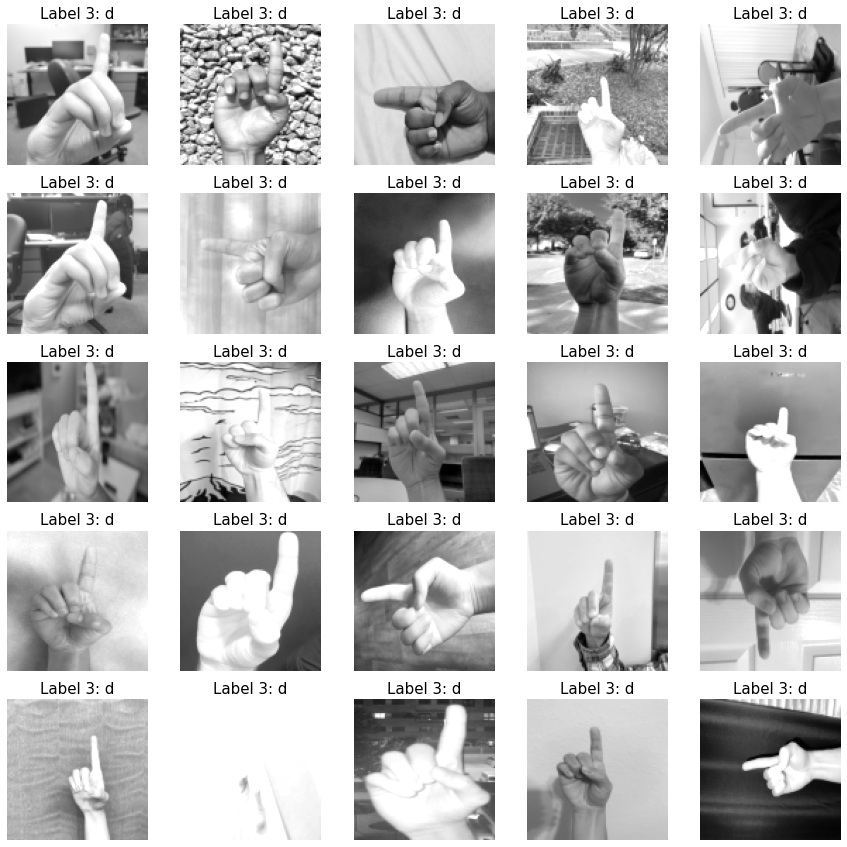

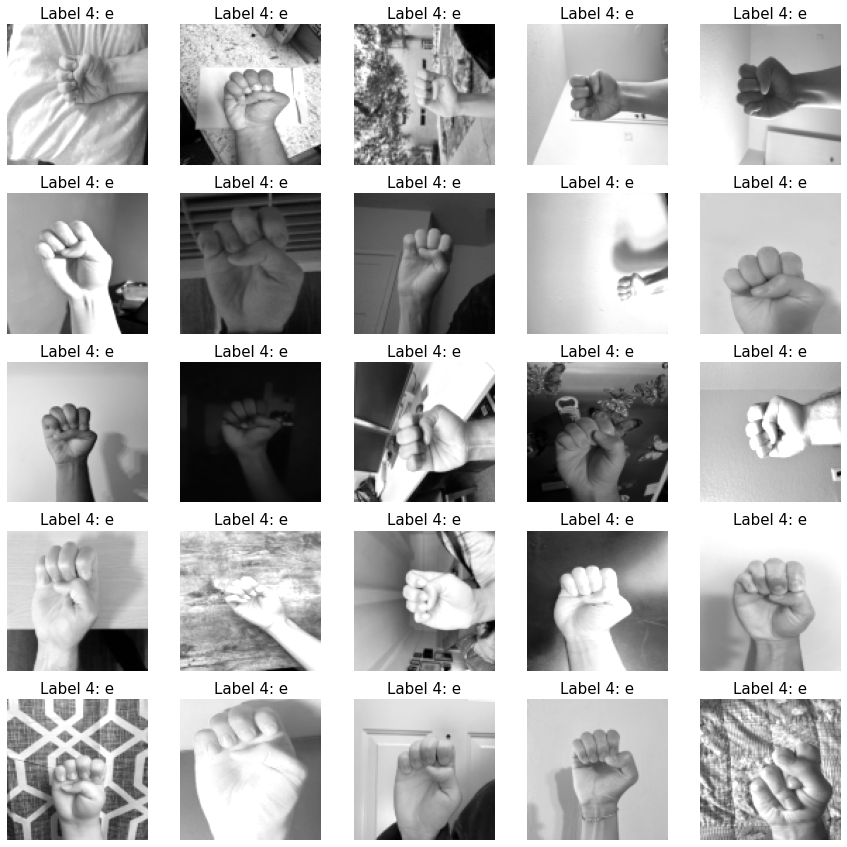

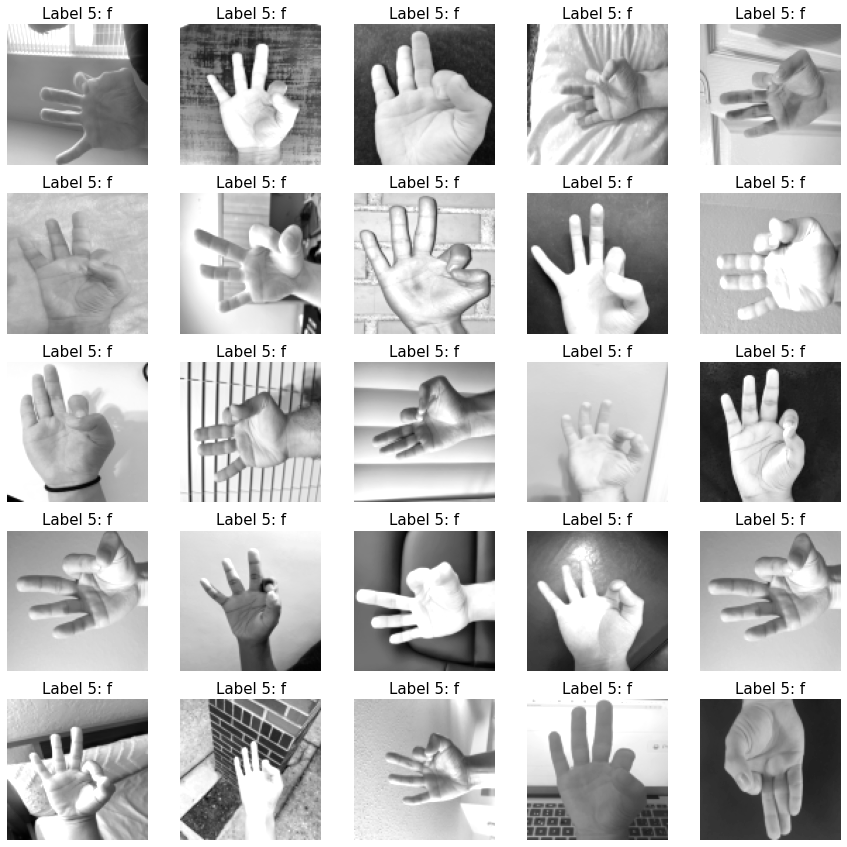

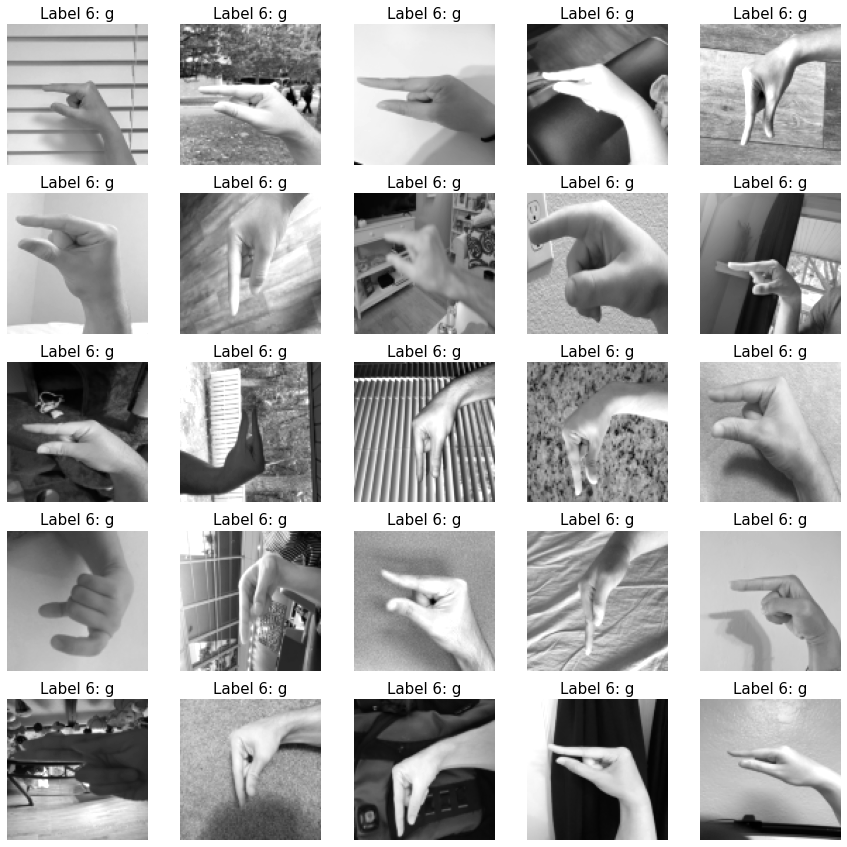

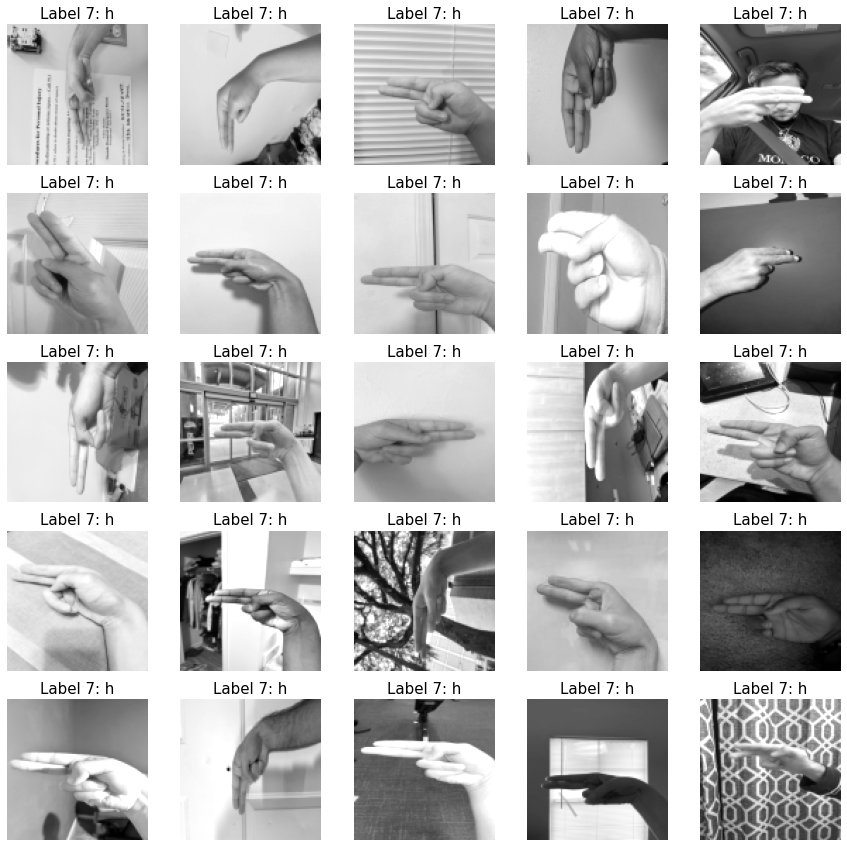

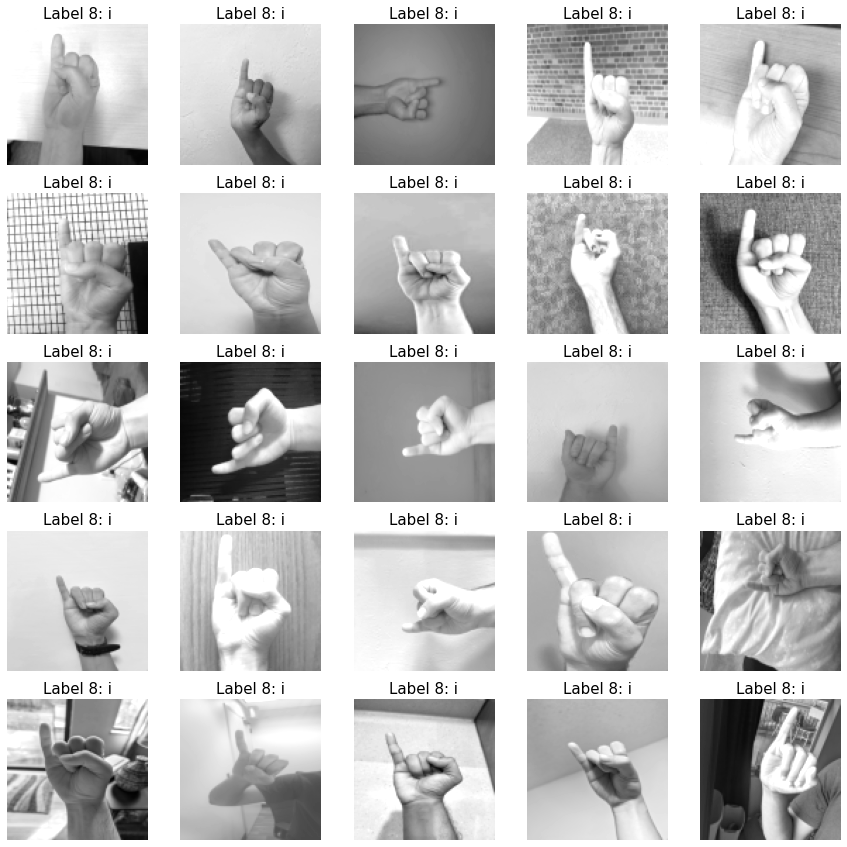

In [18]:
for i in range(0,9):
    rnd_sample = npr.permutation(np.where(labels_train==i)[0])
    fig=plt.figure(figsize=(15,15))
    for j in range(25):
        fig.add_subplot(5,5,j+1)
        plt.imshow(data_train[:,rnd_sample[j]].reshape((100,100, 1)), cmap='gray', vmin=0, vmax=225)
        label_idx = int(labels_train[rnd_sample[j]])
        plt.axis('off');plt.title('Label '+str(label_idx)+': '+labels_names[label_idx],size=15)
    plt.show()
    print('\n\n')

# Training, Test Split

In [19]:
data_train.shape

(10000, 8443)

In [20]:
labels_train.shape

(8443,)

In [21]:
X_train, X_test, t_train, t_test = train_test_split(data_train.T, labels_train, test_size=0.2, stratify=labels_train, random_state=0) 

X_train.shape, X_test.shape, t_train.shape, t_test.shape

((6754, 10000), (1689, 10000), (6754,), (1689,))

# Training

## MinMaxScaler()

In [22]:
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## PCA

In [23]:
pca = PCA()
pca.fit(X_train)

PCA()

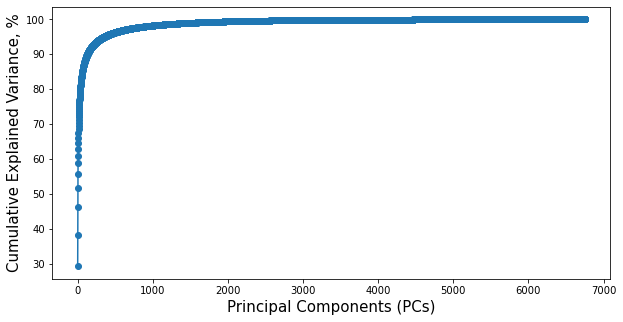

In [25]:
plt.figure(figsize=(10,5))
plt.plot(range(6754), 100*np.cumsum(pca.explained_variance_ratio_),'-o')
plt.xlabel('Principal Components (PCs)',size=15)
plt.ylabel('Cumulative Explained Variance, %', size=15);

In [28]:
num_pcs = np.where(np.cumsum(pca.explained_variance_ratio_)>=0.90)[0][0]

print('We need ',num_pcs+1, 
      ' features in order to explain ',100*np.cumsum(pca.explained_variance_ratio_)[num_pcs],
     '% of the variance in the data')

We need  129  features in order to explain  90.03323259895704 % of the variance in the data


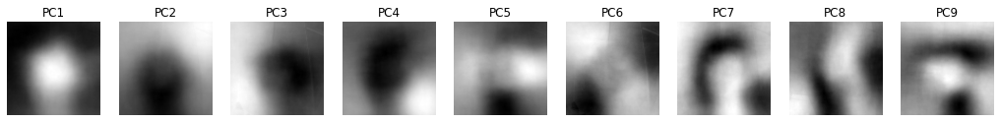

In [29]:
plt.figure(figsize=(20,5))
for i in range(9):
    plt.subplot(1,10,i+1)
    plt.imshow(pca.components_[i,:].reshape(100, 100), cmap='gray')
    plt.title('PC'+str(i+1)); plt.axis('off');


In [30]:
pca = PCA(n_components=num_pcs+1)

X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

## Grid Search Cross-validation

In [31]:
param_grid = {'learning_rate': ['constant', 'optimal', 'invscaling', 'adaptive'],
              'alpha': [0.001, 0.01, 0.1, 0.5, 0.8]}

lr = SGDClassifier(eta0=0.01)

In [32]:
grid_search = GridSearchCV(lr, param_grid=param_grid, cv=KFold(10,shuffle=True,random_state=0), scoring='accuracy', refit = True, verbose=2)
grid_search.fit(X_train, t_train)

Fitting 10 folds for each of 20 candidates, totalling 200 fits
[CV] END ................alpha=0.001, learning_rate=constant; total time=   0.1s
[CV] END ................alpha=0.001, learning_rate=constant; total time=   0.1s
[CV] END ................alpha=0.001, learning_rate=constant; total time=   0.1s
[CV] END ................alpha=0.001, learning_rate=constant; total time=   0.1s
[CV] END ................alpha=0.001, learning_rate=constant; total time=   0.1s
[CV] END ................alpha=0.001, learning_rate=constant; total time=   0.1s
[CV] END ................alpha=0.001, learning_rate=constant; total time=   0.1s
[CV] END ................alpha=0.001, learning_rate=constant; total time=   0.1s
[CV] END ................alpha=0.001, learning_rate=constant; total time=   0.1s
[CV] END ................alpha=0.001, learning_rate=constant; total time=   0.1s
[CV] END .................alpha=0.001, learning_rate=optimal; total time=   1.2s
[CV] END .................alpha=0.001, learnin

GridSearchCV(cv=KFold(n_splits=10, random_state=0, shuffle=True),
             estimator=SGDClassifier(eta0=0.01),
             param_grid={'alpha': [0.001, 0.01, 0.1, 0.5, 0.8],
                         'learning_rate': ['constant', 'optimal', 'invscaling',
                                           'adaptive']},
             scoring='accuracy', verbose=2)

In [33]:
print('Best hyperparameter values:', grid_search.best_params_)

Best hyperparameter values: {'alpha': 0.8, 'learning_rate': 'adaptive'}


In [34]:
lr_best = grid_search.best_estimator_

ValueError: X has 124 features, but PCA is expecting 10000 features as input.

TRAINING SET
              precision    recall  f1-score   support

         0.0       0.30      0.27      0.28       750
         1.0       0.29      0.25      0.26       750
         2.0       0.38      0.32      0.35       750
         3.0       0.22      0.24      0.23       750
         4.0       0.22      0.30      0.25       750
         5.0       0.30      0.28      0.29       752
         6.0       0.32      0.26      0.29       753
         7.0       0.31      0.22      0.26       749
         8.0       0.21      0.30      0.24       750

    accuracy                           0.27      6754
   macro avg       0.28      0.27      0.27      6754
weighted avg       0.28      0.27      0.27      6754



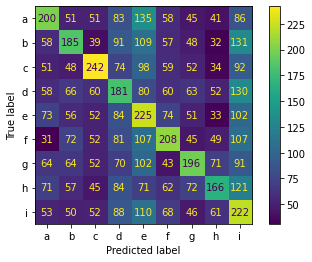



TEST SET
              precision    recall  f1-score   support

         0.0       0.20      0.17      0.18       187
         1.0       0.18      0.16      0.17       187
         2.0       0.28      0.26      0.27       188
         3.0       0.15      0.17      0.16       187
         4.0       0.18      0.24      0.20       187
         5.0       0.20      0.19      0.19       188
         6.0       0.16      0.11      0.13       189
         7.0       0.18      0.14      0.16       188
         8.0       0.14      0.21      0.17       188

    accuracy                           0.18      1689
   macro avg       0.18      0.18      0.18      1689
weighted avg       0.18      0.18      0.18      1689



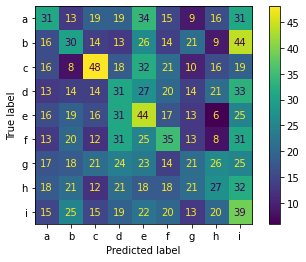

In [35]:
# Making predictions train/test
y_train = lr_best.predict(X_train)
y_test  = lr_best.predict(X_test)

# Displaying results
print('TRAINING SET')
print(classification_report(t_train, y_train))
disp_train=ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(t_train, y_train), 
                                           display_labels=['a', 'b', 'c', 'd', 'e','f','g','h','i'])
disp_train.plot(); plt.show()
print('\n\nTEST SET')
print(classification_report(t_test, y_test))
disp_test=ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(t_test, y_test), 
                                           display_labels=['a', 'b', 'c', 'd', 'e','f','g','h','i'])
disp_test.plot();